In [7]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [8]:
from PIL import Image

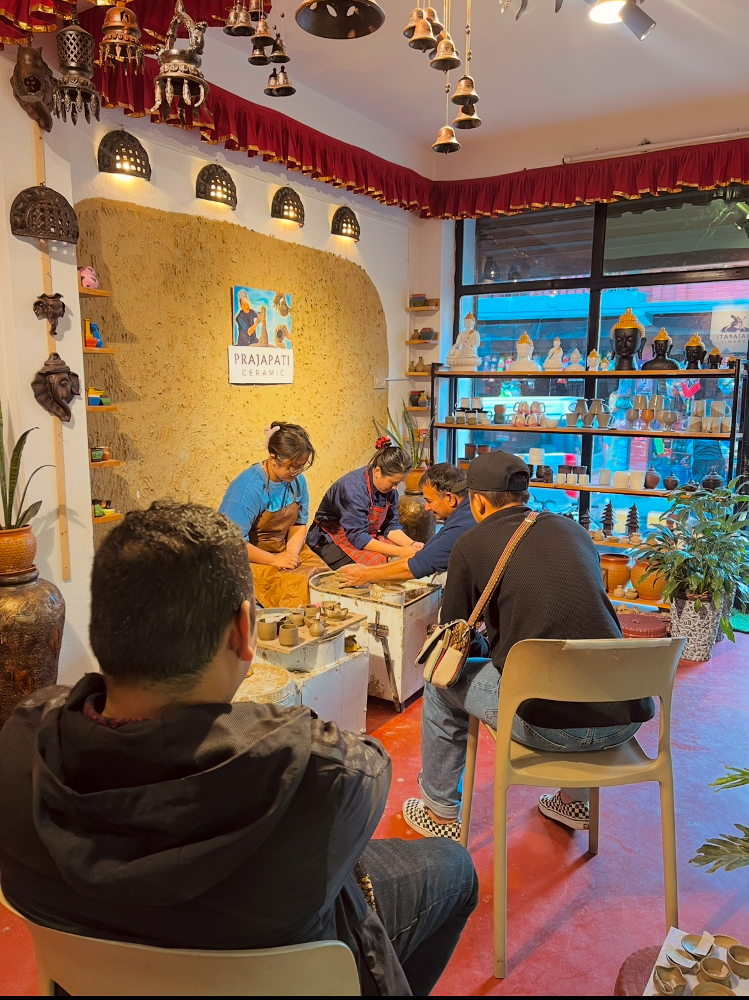

In [9]:
image_colored = Image . open ("/content/drive/MyDrive/AI - Riya/prajapati.jpg")
display ( image_colored )

In [10]:
print ( " Image Format : " , image_colored . format )
print ( " Image Size : " , image_colored . size )
print ( " Image Mode : " , image_colored . mode )

 Image Format :  JPEG
 Image Size :  (1170, 1561)
 Image Mode :  RGB


In [11]:
import numpy as np
image_array = np . array (image_colored)

array([[[138,  14,  22],
        [140,  16,  26],
        [138,  17,  26],
        ...,
        [144,  62,   2],
        [220, 114,  30],
        [239, 137,  39]],

       [[142,  15,  24],
        [141,  15,  26],
        [142,  18,  26],
        ...,
        [ 57,   2,   0],
        [ 66,   5,   0],
        [108,  32,   0]],

       [[142,  12,  24],
        [140,  15,  21],
        [140,  14,  25],
        ...,
        [ 69,   1,   0],
        [ 61,   0,   0],
        [ 54,   0,   2]],

       ...,

       [[184, 141, 109],
        [174, 133, 105],
        [176, 132, 105],
        ...,
        [ 63,  34,  18],
        [ 61,  34,  15],
        [ 51,  24,   7]],

       [[180, 136, 107],
        [178, 137, 105],
        [171, 127, 102],
        ...,
        [ 58,  32,  15],
        [ 63,  36,  17],
        [ 65,  38,  21]],

       [[177, 136, 106],
        [175, 134, 104],
        [169, 130,  99],
        ...,
        [ 51,  28,  12],
        [ 54,  31,  15],
        [ 62,  36,  19]]], dtype=uint8)
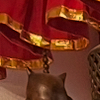

In [12]:
top_left_corner = image_array[:100, :100]
display(top_left_corner)


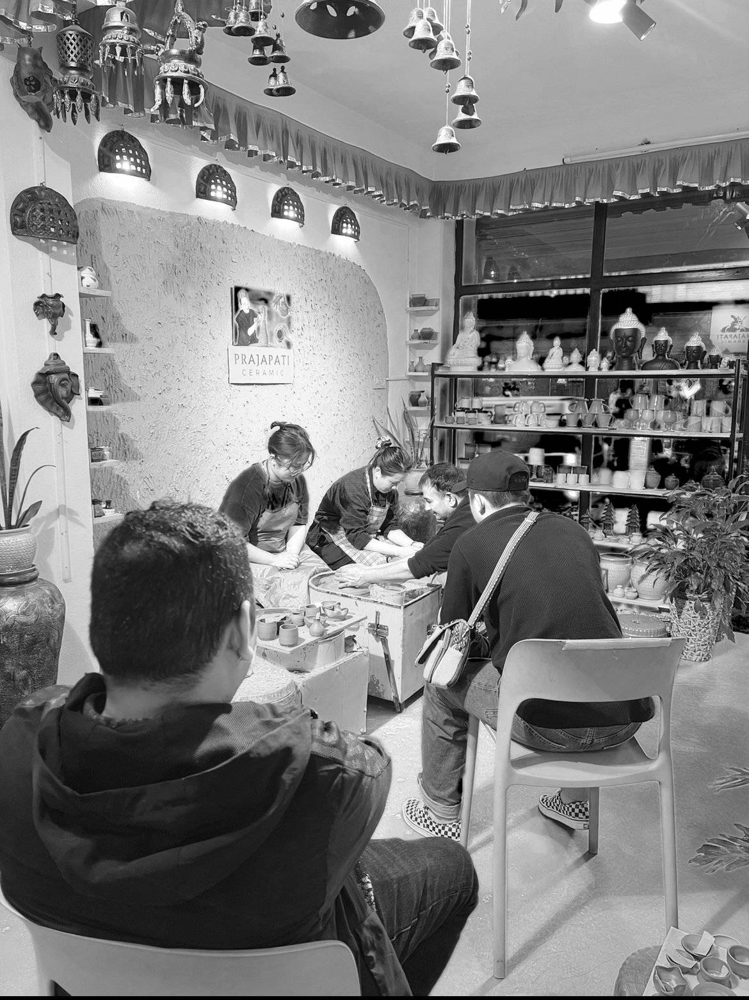

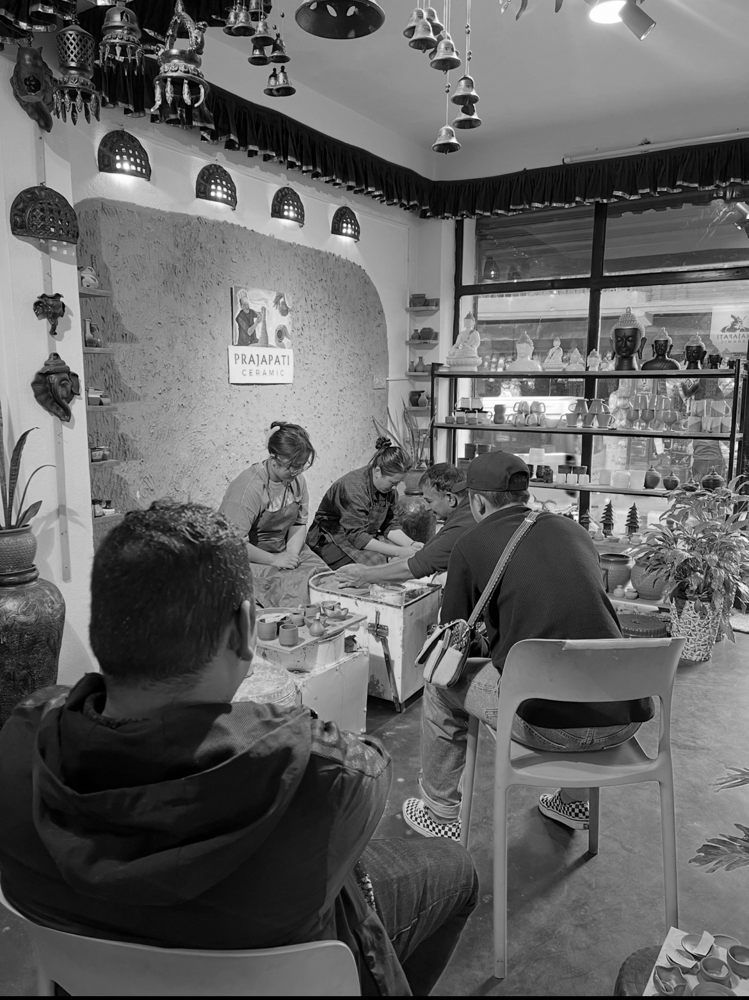

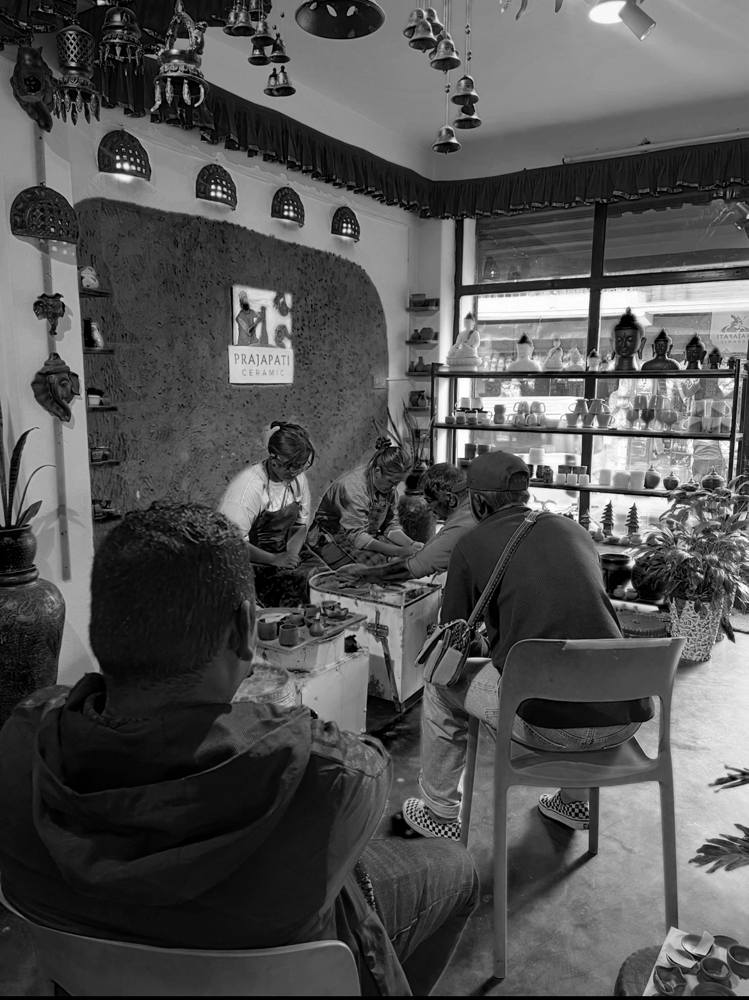

In [13]:
# Assuming image_colored is already defined and loaded above
# Get the R, G, and B channels
r , g , b = image_colored . split ()
# Display or further process the individual channels
display ( r )
display ( g )
display ( b )

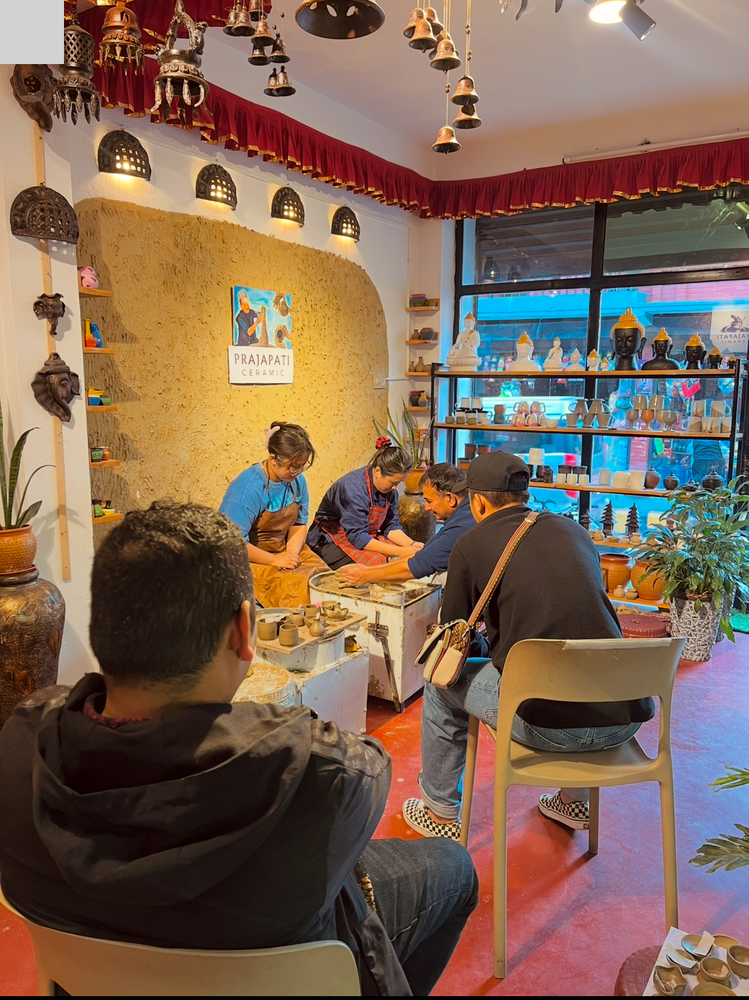

In [14]:
image_array = np.array(image_colored)
image_array[:100, :100] = 210
modified_image = Image.fromarray(image_array.astype(np.uint8))

display(modified_image)


# ***Exercise -2***

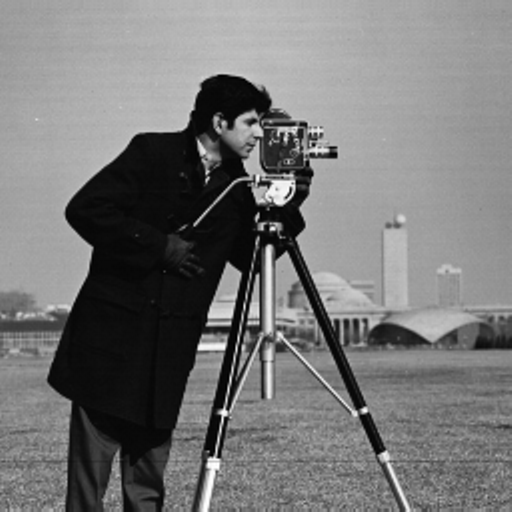

Image Format : PNG
Image Size : (512, 512)
Image Mode : L


In [ ]:
image2 = Image . open ("cameraman.png")

image_grayscale = image2
display(image_grayscale)
print("Image Format :", image_grayscale.format)
print("Image Size :", image_grayscale.size)
print("Image Mode :", image_grayscale.mode)


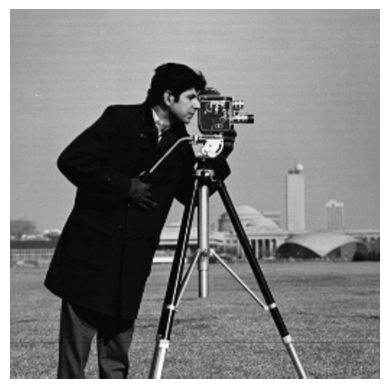

In [ ]:
import matplotlib.pyplot as plt


plt.imshow(image_grayscale, cmap='gray')
plt.axis('off')

plt.show()


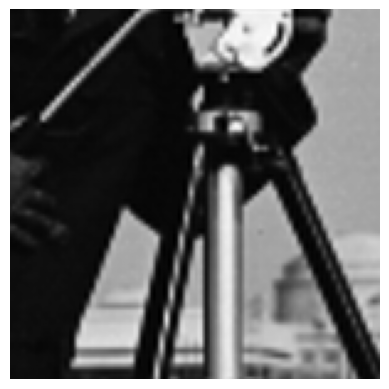

In [ ]:
width, height = image_grayscale.size


center_x = width // 2
center_y = height // 2

half_width = 150 // 2
left = center_x - half_width
top = center_y - half_width
right = center_x + half_width
bottom = center_y + half_width

cropped_image = image_grayscale.crop((left, top, right, bottom))


plt.imshow(cropped_image, cmap='gray')
plt.axis('off')
plt.show()


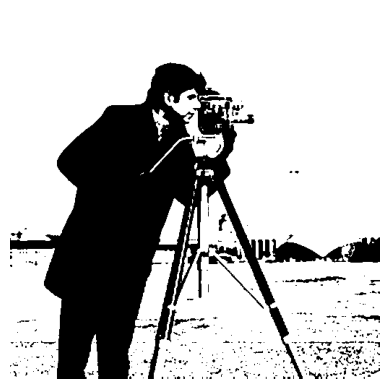

In [ ]:
data = np.array(image2)
binary_data = np.where(data < 100, 0, 255)

# Convert back to an image
binary_image = Image.fromarray(binary_data.astype(np.uint8))

plt.imshow(binary_image, cmap='gray')
plt.axis('off')  # Hide axes
plt.show()

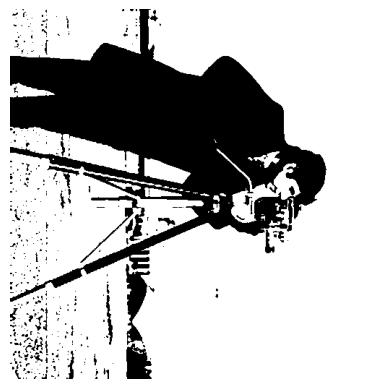

In [ ]:
data = np.array(image2)
binary_data = np.where(data < 100, 0, 255)
binary_image = Image.fromarray(binary_data.astype(np.uint8))


rotated_image = binary_image.rotate(-90, expand=True)


plt.imshow(rotated_image, cmap='gray')
plt.axis('off')
plt.show()


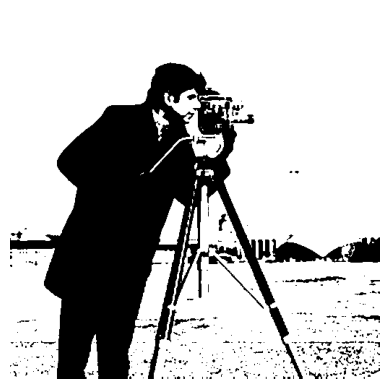

In [ ]:
data = np.array(image2)
binary_data = np.where(data < 100, 0, 255)
binary_image = Image.fromarray(binary_data.astype(np.uint8))
rotated_image = binary_image.rotate(-90, expand=True)

rgb_image = Image.merge("RGB", (binary_image, binary_image, binary_image))


plt.imshow(rgb_image)
plt.axis('off')
plt.show()


# ***Exercise -3***


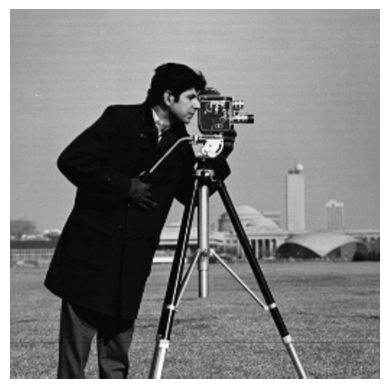

In [ ]:
image = Image.open("cameraman.png").convert("L")
# Convert image to NumPy array
data = np.array(image, dtype=np.float32)

# Center the dataset - Standardize the Data
mean = np.mean(data, axis=0)
standardized_data = data - mean

# Compute the covariance matrix
cov_matrix = np.cov(standardized_data, rowvar=False)

plt.imshow(image, cmap='gray')
plt.axis('off')
plt.show()


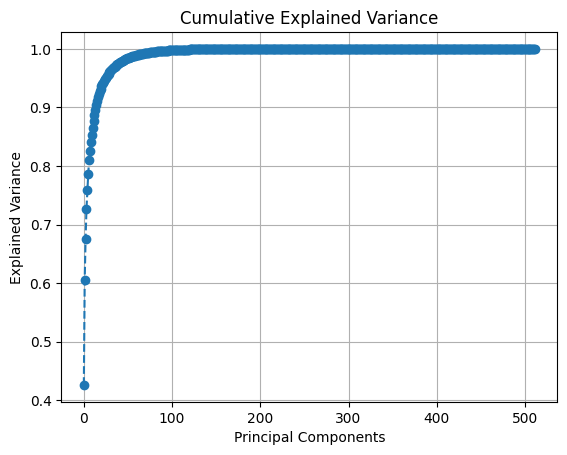

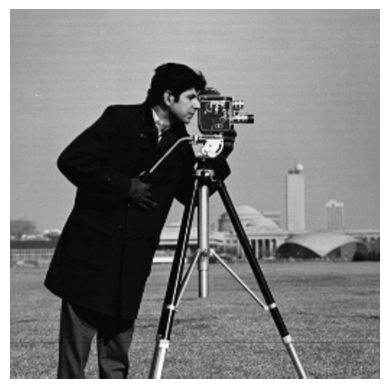

In [ ]:
data = np.array(image, dtype=np.float32)

# Standardize data
standardized_data = data - np.mean(data)

# Compute covariance matrix and eigen decomposition
cov_matrix = np.cov(standardized_data, rowvar=False)
eigenvalues, _ = np.linalg.eigh(cov_matrix)

# Sort and compute cumulative sum
cumulative_sum = np.cumsum(eigenvalues[::-1]) / np.sum(eigenvalues)

# Plot cumulative sum
plt.plot(cumulative_sum, marker='o', linestyle='--')
plt.xlabel('Principal Components')
plt.ylabel('Explained Variance')
plt.title('Cumulative Explained Variance')
plt.grid()
plt.show()

# Show original image
plt.imshow(image, cmap='gray')
plt.axis('off')
plt.show()

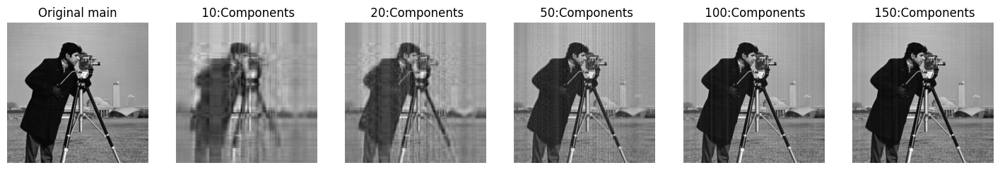

In [ ]:
data = np.array(image, dtype=np.float32)

# Standardize data
mean = np.mean(data)
data -= mean

cov_matrix = np.cov(data, rowvar=False)
eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
idx = np.argsort(eigenvalues)[::-1]
eigenvectors = eigenvectors[:, idx]


components = [10, 20, 50, 100, 150]
fig, axes = plt.subplots(1, 6, figsize=(18, 5))
axes[0].imshow(image, cmap='gray')
axes[0].set_title("Original main")
axes[0].axis("off")

for i, k in enumerate(components):
    reconstructed = (data @ eigenvectors[:, :k] @ eigenvectors[:, :k].T) + mean
    axes[i+1].imshow(reconstructed, cmap='gray')
    axes[i+1].set_title(f" {k}:Components")
    axes[i+1].axis("off")

plt.show()